<a href="https://colab.research.google.com/github/alyssonfa/datasciencepucrio/blob/main/MVP_Alysson_Araujo_Trade_dress.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MVP de Machine Learning & Analytics**

## Aluno: Alysson de Farias de Araujo

### Identificador de infração a Trade Dress dos Postos Petrobras

## 1. Modalidade MVP

Para esse MVP, escolhi um modelo de **Deep Learning para um problema de visão computacional**. Muito embora o projeto escolhido limita as possibilidades de utilização de todos os temas apresentados durante o curso, entendo ser um projeto útil e promissor para solução de um problema encontrado no setor.

## 2. Definição do Problema

A proteção à propriedade imaterial não é novidade no mundo. As legislações acerca da proteção à propriedade intelectual já existem há muitos anos, contando inclusive com medidas coercitivas e punitivas para que se proteja os seus detentores. As marcas fazem parte dessa realidade, e são de extrema importância para o mundo comercial. Diversas marcas agregam imenso valor aos estabelecimentos a que estão associados, sendo, muitas vezes, objetos de licenças específicas e onerosas para sua utilização. Muitos também são os casos onde se usam imagens de forma indevida, sem contrapartida ao seu detentor. Essa é uma realidade muito presente no âmbito dos postos de combustível e as empresas de distribuição. Para os postos, é interessante que eles estejam vinculados a uma distribuidora de combustível consagrada no mercado, de forma que eles possam gozar da confiança do consumidor, por meio da ostentação de tal marca. Nesse setor, empresas como Ipiranga, Shell e Vibra (antiga BR Distribuídora e detentora do direito de imagem dos Postos Petrobras) fazem contratos comerciais que, por vezes, preveem a licença do uso de marca. Ocorre que alguns postos ostentam tais imagens indevidamente, seja porque um dia já tiveram o direito de usá-la, e hoje não mais, mas seguem utilizando, ou jamais tiveram esse direito, mas copiaram a imagem para simulação.

Especificamente para o caso da Vibra, há uma preocupação enorme quanto ao uso de sua imagem, especialmente para garantir que somente os revendedores autorizados utilizem o Trade Dress dos Postos Petrobras. No âmbito dessa fiscalização, muitas vezes são enviados relatórios pelas zonas de vendas, com diversas fotos feitas de postos de cada região, para que seja detectado se os postos estão utilizando indevidamente ou não a marca.

Sendo assim, o objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem de um posto em "Caracterizado" e "Não caracterizado", de forma a fazer uma triagem dos postos que utilizam o trade dress da empresa, para que seja aferido se o utilizam de forma legal ou ilegal.

## 3. Estrutura

O presente notebook se encontra organizado da seguinte forma:

4. Importação de bibliotecas e demais utilidades
5. Carregamento e tratamento das imagens que serão utilizadas para entrada do modelo de deep learning
6. Divisão dos dados em treino e teste
7. Preparo dos dados carregados
8. Configuração do modelo
9. Treinamento do modelo
10. Execução do modelo treinado em um subconjunto de teste (50 postos)
11. Avaliação do modelo de deep learning
12. Exportação do modelo de deep learning
13. Conclusões finais

## 4. Importação de bibliotecas e demais utilidades

Aqui faremos a importação das bibliotecas gerais utilizadas. Ao longo do trabalho podem ser necessárias outras bibliotecas, que serão importadas no caso a caso.

In [2]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import requests
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import matplotlib.pyplot as plt

Para avaliação de métricas do modelo, aproveito para importar o necessário para confecção de matriz de confusão

In [3]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalizada")
    else:
        print('Sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

## 5. Carregamento e tratamento das imagens que serão utilizadas para entrada do modelo de deep learning

In [4]:
# URL base do GitHub onde os arquivos zip estão localizados
url_base = 'https://github.com/alyssonfa/datasciencepucrio/raw/main/'

# Lista de nomes dos arquivos zip - Aqui tive que separar em mais arquivos, pois
# estava muito grande.
nomes_arquivos_zip = [
    'Trade1.zip',
    'Trade2.zip',
    'Untrade1.zip',
    'Untrade2.zip'
]

# Pasta de destino para todas as imagens
pasta_destino = 'imagens_extraidas/'

# Cria a pasta de destino se não existir
os.makedirs(pasta_destino, exist_ok=True)

# Percorre cada arquivo zip
for nome_arquivo_zip in nomes_arquivos_zip:
    # URL completa do arquivo zip no GitHub
    url_zip = url_base + nome_arquivo_zip

    # Baixa o arquivo zip
    response = requests.get(url_zip)

    # Salva o arquivo zip localmente
    with open(nome_arquivo_zip, 'wb') as f:
        f.write(response.content)

    # Extrai o conteúdo do arquivo zip
    with zipfile.ZipFile(nome_arquivo_zip, 'r') as zip_ref:
        # Extrai os arquivos do zip para a pasta de destino
        zip_ref.extractall(path=pasta_destino)

    # Remove o arquivo zip após a extração
    os.remove(nome_arquivo_zip)

# Lista todos os arquivos dentro da pasta de destino
arquivos = [f for f in os.listdir(pasta_destino) if os.path.isfile(os.path.join(pasta_destino, f))]

# Exibe os primeiros 20 itens da lista de arquivos
print(f"Primeiras 20 imagens: \n {arquivos[:20]}")

Primeiras 20 imagens: 
 ['083y.PNG', '054y.PNG', '028n.PNG', '141n.PNG', '057n.PNG', '008y.PNG', '041n.PNG', '065n.PNG', '038n.PNG', '153n.PNG', '031n.PNG', '016n.PNG', '014n.PNG', '027y.PNG', '131n.PNG', '085n.PNG', '171n.PNG', '005y.PNG', '104n.PNG', '047y.PNG']


Verificação se todos os arquivos foram carregados

In [5]:
path=pasta_destino
print(f"Há {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Há 290 imagens para o treinamento e avaliação do modelo de deep learning


Nesse passo, estou tratando os dados, criando um dataset com as características de cada imagem.

In [6]:
imagens_dir = 'imagens_extraidas'

images = []
labels = []
heights = []
widths = []
channels = []
filesize = []

for imagem in os.listdir(imagens_dir):
    path_imagem = os.path.join(imagens_dir, imagem)
    if imagem.endswith('.PNG') or imagem.endswith('.png'):
        labels.append(imagem[3])  # Adiciona o quarto caractere do nome do arquivo como rótulo
        img = mpimg.imread(path_imagem)
        img_shape = img.shape
        heights.append(img_shape[0])
        widths.append(img_shape[1])
        channels.append(img_shape[2])
        filesize.append(os.path.getsize(path_imagem))
        images.append(imagem)

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                   'width': widths, 'channels': channels, 'filesize': filesize})

Vamos ver as primeiras linhas do df.

In [7]:
print(df.head(25))

      images class  height  width  channels  filesize
0   083y.PNG     y     603    674         4    935469
1   054y.PNG     y     241    361         4    219194
2   028n.PNG     n     319    440         4    249129
3   141n.PNG     n     203    249         4    101669
4   057n.PNG     n     244    370         4    205483
5   008y.PNG     y     239    332         4    147946
6   041n.PNG     n     207    421         4    215642
7   065n.PNG     n     218    431         4    198185
8   038n.PNG     n     235    324         4    152389
9   153n.PNG     n     238    464         4    286983
10  031n.PNG     n     204    374         4    169855
11  016n.PNG     n     305    445         4    203912
12  014n.PNG     n     294    636         4    193599
13  027y.PNG     y     149    386         4    118255
14  131n.PNG     n     217    379         4    227947
15  085n.PNG     n     235    375         4    177508
16  171n.PNG     n     236    397         4    239042
17  005y.PNG     y     252  

Aqui verei se meus dados estão balanceados. Tenho um problemas com eles, referente ao meu espaço amostral, que já é pequeno. Portanto, se eu balancear, ficarão ainda menos dados. Sendo assim, preferi deixar desbalanceado.

class
n    190
y    100
Name: count, dtype: int64


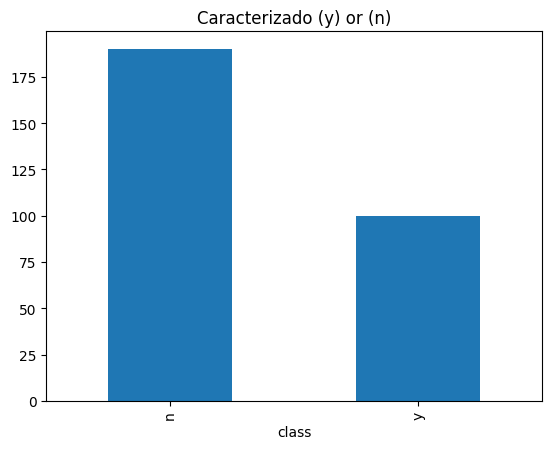

In [8]:
print((df['class']).value_counts())
tradedress_count = df['class'].value_counts().plot.bar(title='Caracterizado (y) or (n)')

Aqui estão classificados os itens em Caracterizado (y) ou Não Caracterizado (n), referente aos postos estarem (y) ou não (n) com a imagem dos postos Petrobras.

Em seguida, vou verificar se as imagens foram carregadas corretamente com suas labels, de acordo com a lógica acima explicitada.

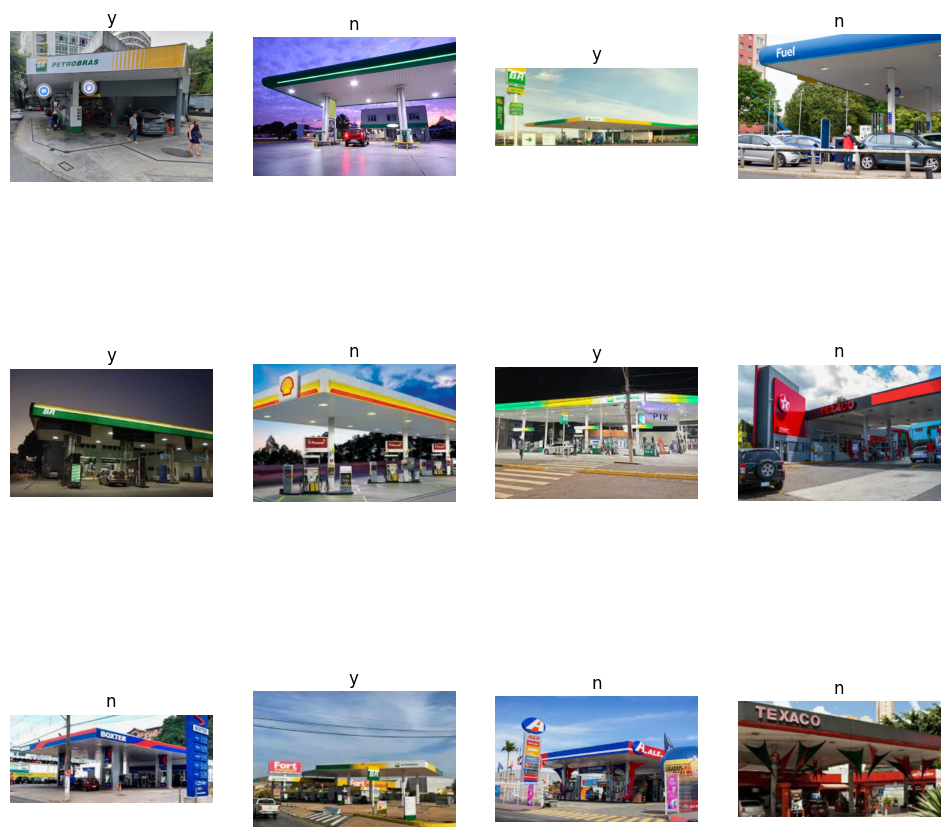

In [9]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[3])

plt.show()

A labels estão corretas.

## 6. Divisão dos dados em treino e teste

Para esse caso, escolhi uma divisão de 30% das imagens para teste e 70% para treinamento, útil para o modelo de deep learning. Garanti que os modelos não tenham imagens repetidas, para não contaminar a análise.

In [11]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

A divisão de dados ficou da forma a seguir:

In [12]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
       images class
18   104n.PNG     n
275  013y.PNG     y
86   048y.PNG     y
227  127n.PNG     n
92   028y.PNG     y
..        ...   ...
188  048n.PNG     n
71   044y.PNG     y
106  015n.PNG     n
270  024n.PNG     n
102  124n.PNG     n

[203 rows x 2 columns]
##### Test: #####
       images class
84   082y.PNG     y
258  066n.PNG     n
45   107n.PNG     n
175  068y.PNG     y
143  091n.PNG     n
..        ...   ...
126  151n.PNG     n
137  112n.PNG     n
111  090y.PNG     y
210  063n.PNG     n
152  084y.PNG     y

[87 rows x 2 columns]


## 7. Preparo dos dados carregados



Considerando se tratar de um modelo de deep learning, entendi útil utilizar a classe ImageDataGenerator para aumentar e realizar o pré-processamento dos dados de imagens.

In [13]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 163 validated image filenames belonging to 2 classes.
Found 40 validated image filenames belonging to 2 classes.
Found 87 validated image filenames belonging to 2 classes.


Apenas para demonstrar um exemplo do tratamento feito às imagens utilizando o método citado.



Found 1 validated image filenames belonging to 1 classes.


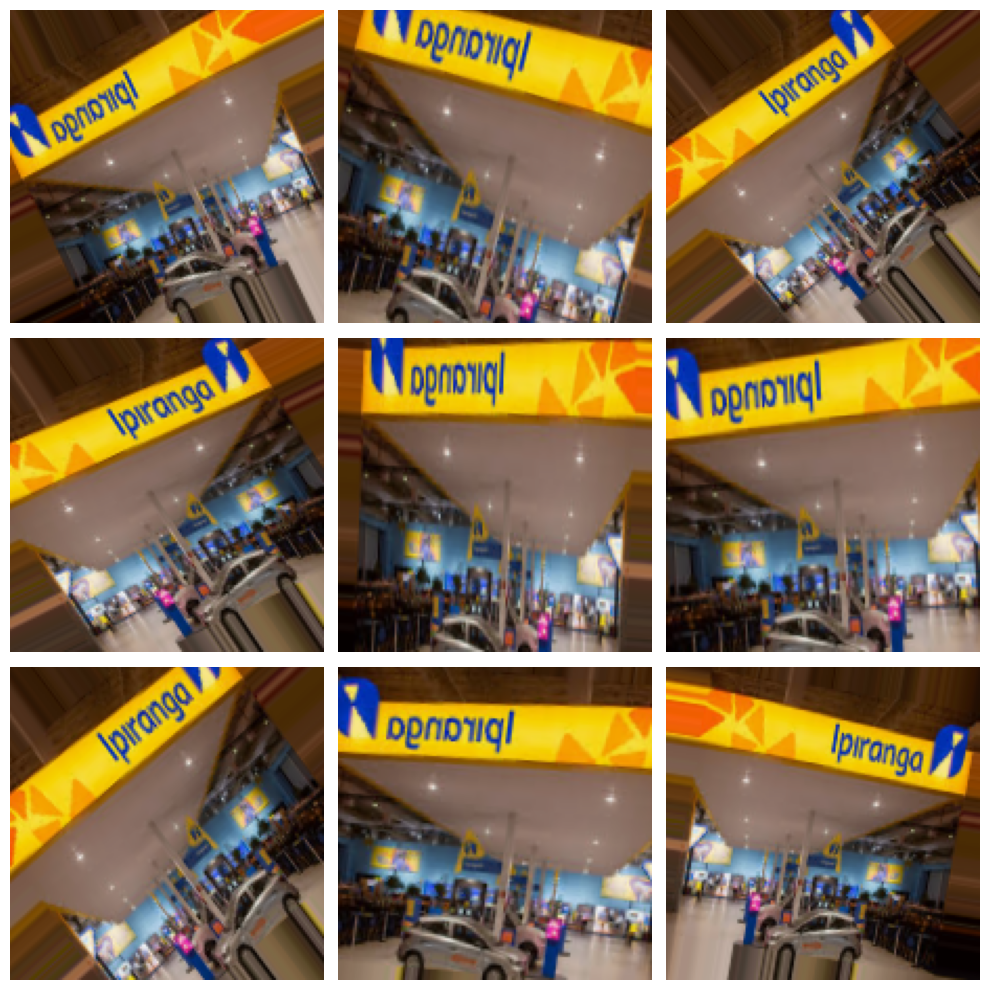

In [14]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

## 8. Configuração do modelo

Nesse passo, vamos partir para a definição da arquitetura do modelo. nesse caso, foi escolhio uma rede neural convolucional (CNN) simples com a biblioteca Keras.

In [15]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [16]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

Em seguida, vamos exibir um resumo da arquitetura do modelo de rede neural.

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

Esta é uma arquitetura de CNN típica para problemas de classificação de imagens, com camadas convolucionais seguidas por camadas de max pooling para extração de características e camadas densas para classificação final. O número de parâmetros treináveis é relativamente alto, o que pode exigir um conjunto de dados de treinamento adequado para evitar overfitting.

Eis o problema. Como o meu conjunto de dados é composto de apenas 315 imagens, existem várias consequências potenciais a serem consideradas:

**Overfitting:** Com um número limitado de exemplos de treinamento, o modelo pode facilmente memorizar os dados de treinamento em vez de aprender padrões gerais. Isso pode levar a um desempenho muito pior em dados de teste não vistos.

**Alta sensibilidade aos dados de treinamento:** Como há poucos exemplos de treinamento, o modelo pode se tornar altamente sensível a variações nos dados de treinamento, o que pode não refletir bem a distribuição dos dados do mundo real.

**Dificuldade em generalizar:** Com um conjunto de dados tão pequeno, o modelo pode ter dificuldade em generalizar para novos dados que não fazem parte do conjunto de treinamento. Isso pode resultar em um desempenho ruim em dados de teste ou em situações do mundo real.

**Limitações na complexidade do modelo:** Com um conjunto de dados pequeno, é importante manter a complexidade do modelo baixa para evitar overfitting. Isso pode limitar a capacidade do modelo de capturar padrões complexos nos dados.

**Necessidade de técnicas de regularização:** Técnicas de regularização, como Dropout e aumento de dados, podem ser ainda mais importantes em conjuntos de dados pequenos para ajudar a evitar overfitting e melhorar a capacidade de generalização do modelo.



## 9. Treinamento do modelo

In [18]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método fit_generator() inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento train_generator e o gerador de dados de validação val_generator.

In [26]:
history=model.fit(train_generator ,
                            steps_per_epoch=50,
                            epochs=5 ,
                            validation_data=val_generator ,
                            validation_steps=50)

Epoch 1/5
 4/50 [=>............................] - ETA: 1:35 - loss: 0.6438 - accuracy: 0.6503

50/50 [==============================] - 12s 163ms/step - loss: 0.6438 - accuracy: 0.6503 - val_loss: 0.6452 - val_accuracy: 0.6500


**Aqui topamos com um aviso relevante:** O conjunto de dados de treinamento não possui dados suficientes para preencher todas as etapas (batches) necessárias durante o treinamento do modelo. Fica claro que é pelo tamanho insuficiente do conjunto de dados, ocorrendo uma interrupção prematura do treinamento devido à falta de dados.

Futuramente, para tentar minimizar esse erro, tentarei obter mais dados, para aumentar a quantidade dos meus dados de treinamento. Por ora, utilizarei a **função repeat()**, para os dados sejam repetidos, aumentando a quantidade de dados durante o treinamento.

In [27]:
def repeat_generator(generator):
    while True:
        for batch in generator:
            yield batch

# Treinar o modelo usando o gerador original
history = model.fit(train_generator,
                    steps_per_epoch=50,
                    epochs=5,
                    validation_data=val_generator,
                    validation_steps=50)

# Criar um novo gerador baseado no gerador original
train_generator_repeated = repeat_generator(train_generator)
val_generator_repeated = repeat_generator(val_generator)

# Treinar o modelo usando o novo gerador
history = model.fit(train_generator_repeated,
                    steps_per_epoch=50,
                    epochs=5,
                    validation_data=val_generator_repeated,
                    validation_steps=50)

Epoch 1/5
 4/50 [=>............................] - ETA: 1:35 - loss: 0.6354 - accuracy: 0.6503

50/50 [==============================] - 14s 157ms/step - loss: 0.6354 - accuracy: 0.6503 - val_loss: 0.6383 - val_accuracy: 0.6500
Epoch 1/5
50/50 [==============================] - 206s 4s/step - loss: 0.4630 - accuracy: 0.7427 - val_loss: 0.8853 - val_accuracy: 0.7820
Epoch 2/5
50/50 [==============================] - 196s 4s/step - loss: 0.3590 - accuracy: 0.8405 - val_loss: 0.5624 - val_accuracy: 0.7925
Epoch 3/5
50/50 [==============================] - 198s 4s/step - loss: 0.2549 - accuracy: 0.8891 - val_loss: 0.5941 - val_accuracy: 0.8160
Epoch 4/5
50/50 [==============================] - 196s 4s/step - loss: 0.1667 - accuracy: 0.9331 - val_loss: 0.5995 - val_accuracy: 0.8240
Epoch 5/5
50/50 [==============================] - 197s 4s/step - loss: 0.1641 - accuracy: 0.9353 - val_loss: 0.4557 - val_accuracy: 0.8500


Observamos um comportamento interessante durante o novo treinamento. Na primeira execução, encontramos interrupções devido à falta de dados, indicando que o gerador original não estava fornecendo dados suficientes para todas as etapas de treinamento e validação. Isso pode ser considerado um problema de **underfitting**, onde o modelo não foi capaz de aprender efetivamente com os dados disponíveis devido à insuficiência de exemplos de treinamento.

Para contornar essa questão, utilizamos a função repeat_generator para garantir que o gerador continuasse fornecendo dados indefinidamente. No entanto, ao analisar as métricas de desempenho, observamos um possível problema de **overfitting**. Enquanto a acurácia no conjunto de treinamento aumentava significativamente ao longo das épocas, a acurácia no conjunto de validação estagnava ou até diminuía em algumas épocas. **Isso sugere que o modelo pode ter aprendido a se ajustar muito bem aos dados de treinamento específicos, mas não generalizou bem para dados não vistos do conjunto de validação.**

Portanto, podemos concluir que o modelo pode estar sofrendo de overfitting devido à complexidade do modelo ou à falta de regularização. **Para melhorar o desempenho e a generalização do modelo, pode ser necessário ajustar os hiperparâmetros, como a taxa de aprendizado, o que será feito em seguida.**

In [30]:
# Calcular o número de etapas de validação
validation_steps = len(val_generator)

# Calcular o número de etapas por época de treinamento
steps_per_epoch = len(train_generator)

# Treinar o modelo com o número correto de etapas de validação e de treinamento
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=5,
                    validation_data=val_generator,
                    validation_steps=validation_steps)

Epoch 1/5
4/4 [==============================] - 12s 4s/step - loss: 0.1401 - accuracy: 0.9509 - val_loss: 0.6770 - val_accuracy: 0.8750
Epoch 2/5
4/4 [==============================] - 11s 2s/step - loss: 0.1527 - accuracy: 0.9448 - val_loss: 0.4599 - val_accuracy: 0.8000
Epoch 3/5
4/4 [==============================] - 11s 2s/step - loss: 0.1189 - accuracy: 0.9571 - val_loss: 0.6678 - val_accuracy: 0.8250
Epoch 4/5
4/4 [==============================] - 10s 3s/step - loss: 0.1329 - accuracy: 0.9509 - val_loss: 0.4738 - val_accuracy: 0.8750
Epoch 5/5
4/4 [==============================] - 10s 3s/step - loss: 0.1395 - accuracy: 0.9448 - val_loss: 0.2276 - val_accuracy: 0.8750


In [31]:
from tensorflow.keras.optimizers import Adam

# Definir o otimizador com uma taxa de aprendizado inicial
optimizer = Adam(learning_rate=0.001)

# Compilar o modelo com o otimizador definido
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

validation_steps = len(val_generator)

# Treinar o modelo com o número correto de etapas de validação e de treinamento
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=5,
                    validation_data=val_generator,
                    validation_steps=validation_steps)

Epoch 1/5
4/4 [==============================] - 13s 3s/step - loss: 0.2899 - accuracy: 0.9264 - val_loss: 0.2396 - val_accuracy: 0.9250
Epoch 2/5
4/4 [==============================] - 10s 2s/step - loss: 0.1101 - accuracy: 0.9571 - val_loss: 0.7857 - val_accuracy: 0.8250
Epoch 3/5
4/4 [==============================] - 10s 2s/step - loss: 0.1085 - accuracy: 0.9693 - val_loss: 0.8356 - val_accuracy: 0.8000
Epoch 4/5
4/4 [==============================] - 10s 2s/step - loss: 0.1120 - accuracy: 0.9571 - val_loss: 0.7361 - val_accuracy: 0.8500
Epoch 5/5
4/4 [==============================] - 10s 2s/step - loss: 0.0965 - accuracy: 0.9509 - val_loss: 0.5574 - val_accuracy: 0.8500


Não se trata de uma solução definitiva, mas ajustei o código para garantir que o modelo seja treinado em todos os lotes disponíveis no conjunto de dados de treinamento e validação. Além disso, modifiquei a taxa de aprendizado do otimizador Adam para tentar influenciar na convergência do modelo durante o treinamento. Essas alterações são importantes para garantir que o modelo seja treinado de forma adequada e eficiente, melhorando assim suas capacidades de generalização e desempenho. A solução definitiva virá como aumento de amostrar, mas tais ajustes nos permitem continuar. A seguir, algumas observações relevantes:

**Divergência de desempenho:** O desempenho do modelo no conjunto de validação não segue uma tendência consistente ao longo das épocas. Por exemplo, na segunda época, a precisão no conjunto de validação é maior do que na primeira, mas depois diminui novamente nas épocas seguintes.

**Possível overfitting:** A diferença entre a precisão no conjunto de treinamento e no conjunto de validação pode indicar que o modelo está se ajustando demais aos dados de treinamento, resultando em um desempenho inferior em novos dados. Isso é evidenciado pelo fato de que a precisão no conjunto de treinamento é consistentemente maior do que no conjunto de validação.

**Inconsistência na generalização:** O desempenho do modelo no conjunto de validação é bastante variável entre as épocas, o que sugere que o modelo pode não estar generalizando bem para novos dados.



## 10. Execução do modelo treinado em um subconjunto de teste (50 postos)

Para que o MVP rode sem muito gasto de tempo, limitarei a testar em apenas 50 imagens do conjunto de testes, sendo, portanto, um subconjunto de testes.

2/2 [==============================] - 1s 193ms/step


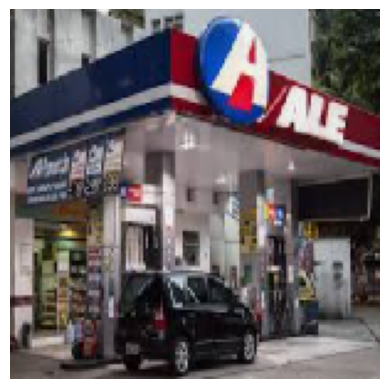

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


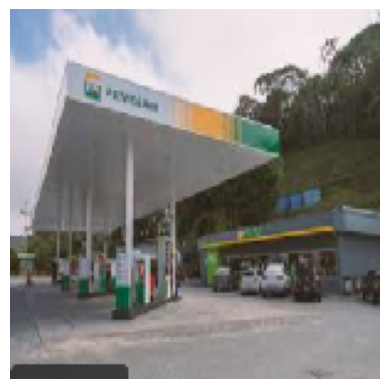

Label verdadeiro: y
Previsão: y
Probabilidade: 0.95870996
---------------------------------------


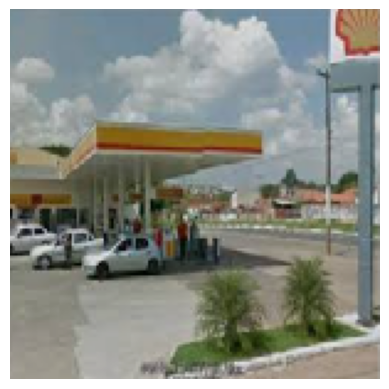

Label verdadeiro: n
Previsão: n
Probabilidade: 0.6266212165355682
---------------------------------------


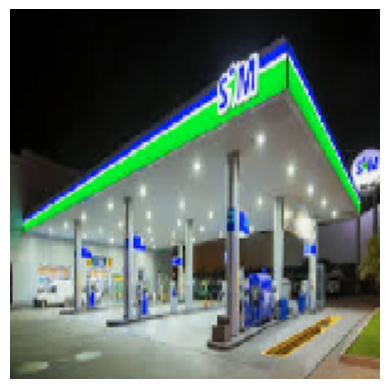

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999998959
---------------------------------------


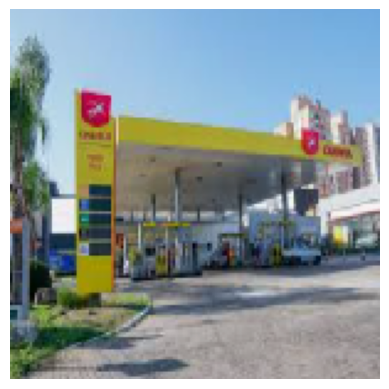

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999998271554631
---------------------------------------


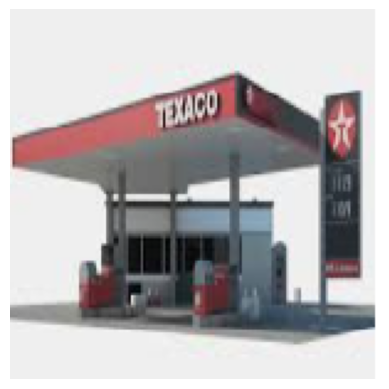

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999933143194539
---------------------------------------


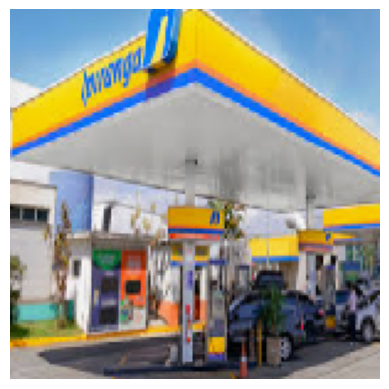

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


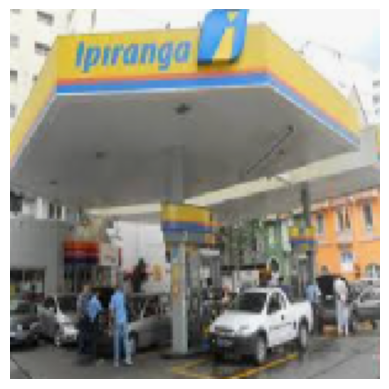

Label verdadeiro: n
Previsão: n
Probabilidade: 0.8918304294347763
---------------------------------------


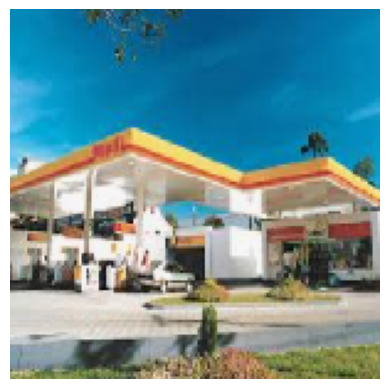

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9022085070610046
---------------------------------------


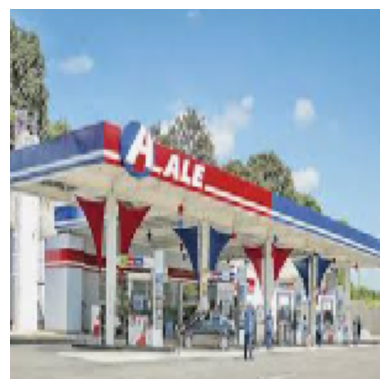

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999960175
---------------------------------------


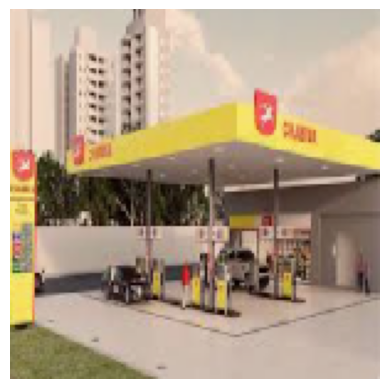

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9892039755359292
---------------------------------------


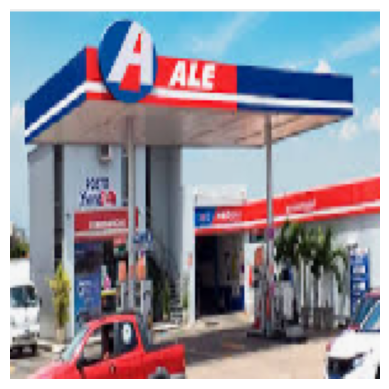

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


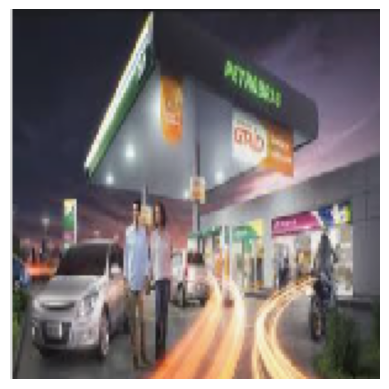

Label verdadeiro: y
Previsão: y
Probabilidade: 0.92795026
---------------------------------------


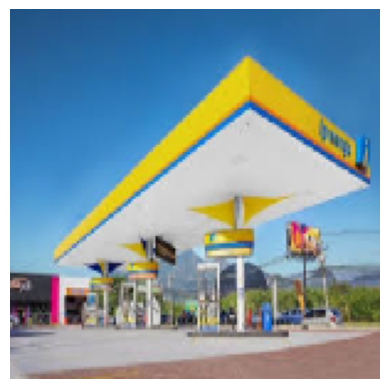

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999778381989017
---------------------------------------


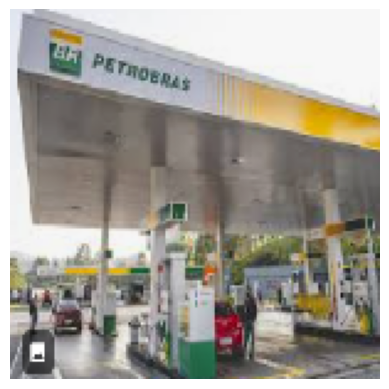

Label verdadeiro: y
Previsão: y
Probabilidade: 0.91765827
---------------------------------------


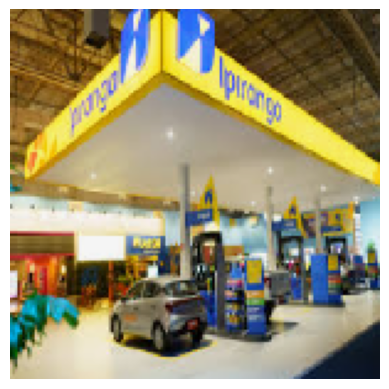

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999861113856241
---------------------------------------


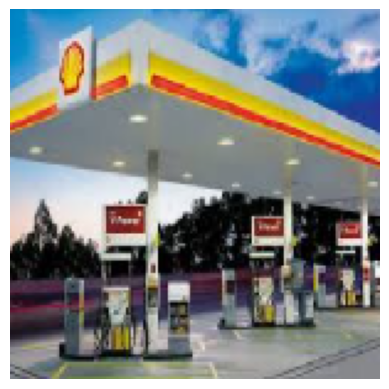

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999886536
---------------------------------------


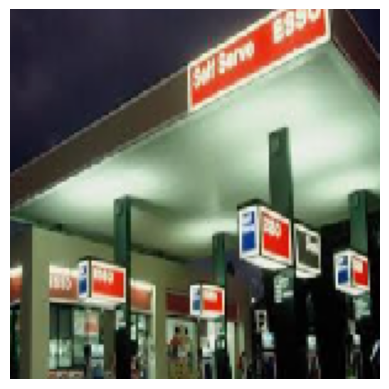

Label verdadeiro: n
Previsão: n
Probabilidade: 0.999999162214749
---------------------------------------


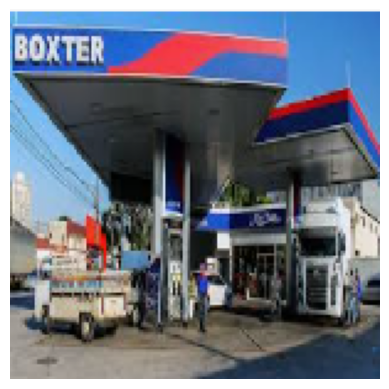

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


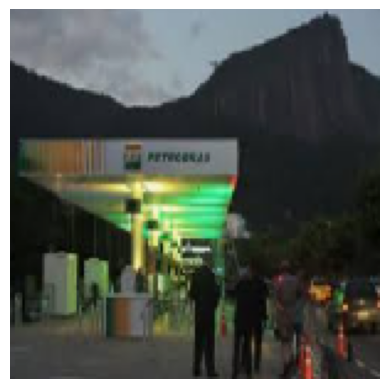

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9997362
---------------------------------------


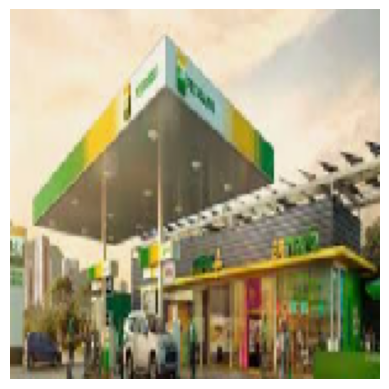

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9640148
---------------------------------------


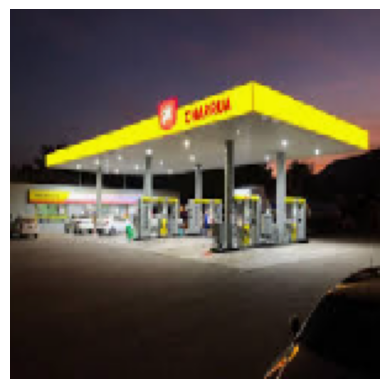

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999674411058
---------------------------------------


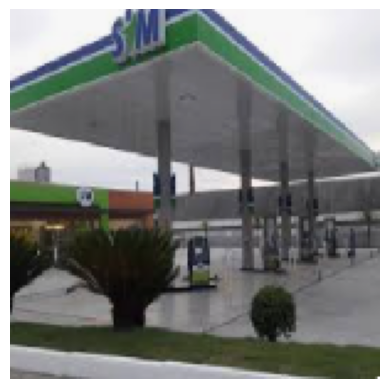

Label verdadeiro: n
Previsão: y
Probabilidade: 0.945003
---------------------------------------


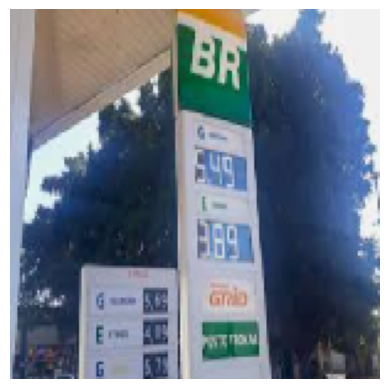

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9404956
---------------------------------------


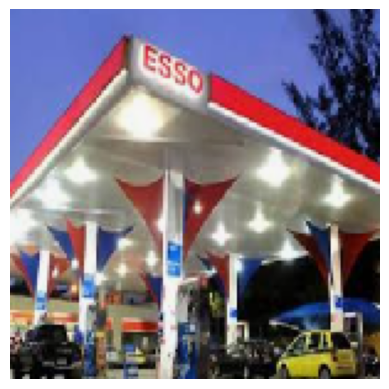

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


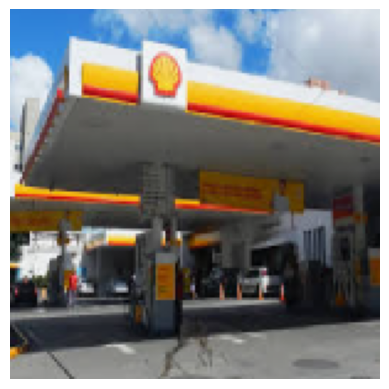

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999999889
---------------------------------------


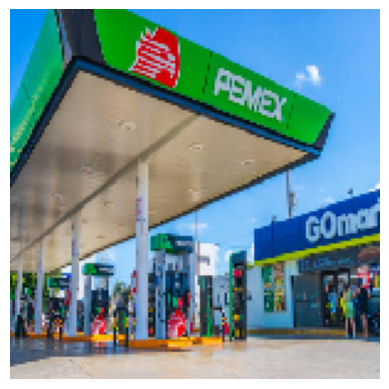

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999995539126
---------------------------------------


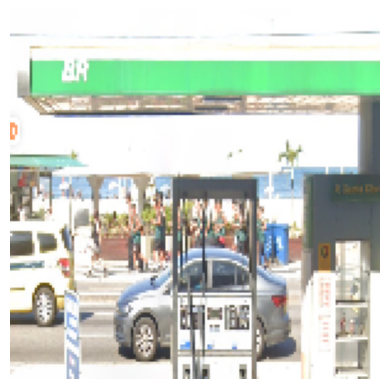

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9847055
---------------------------------------


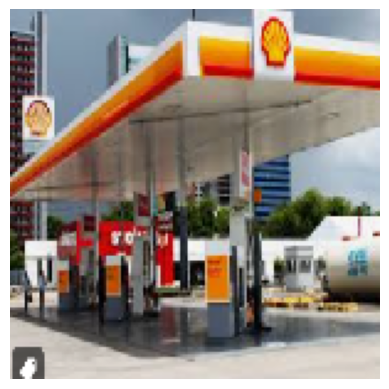

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


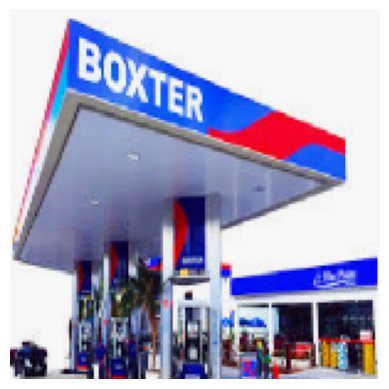

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


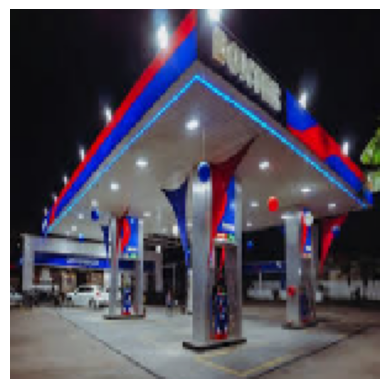

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


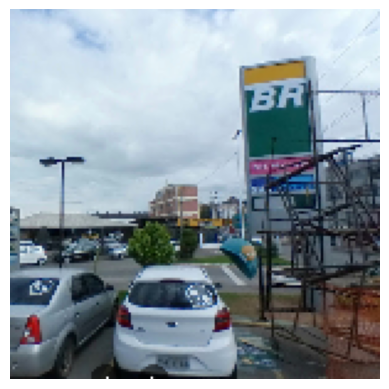

Label verdadeiro: y
Previsão: y
Probabilidade: 0.68479216
---------------------------------------


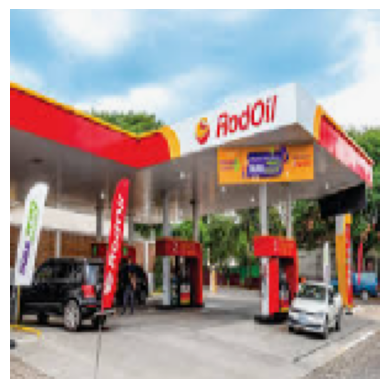

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


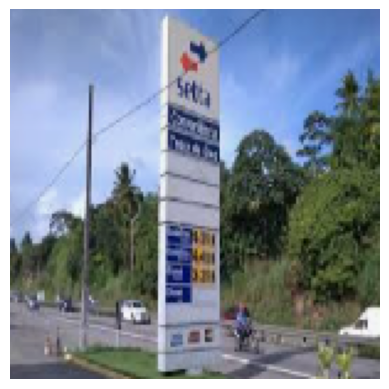

Label verdadeiro: n
Previsão: n
Probabilidade: 0.933451235294342
---------------------------------------


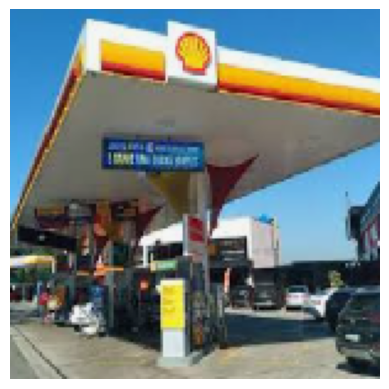

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999983218
---------------------------------------


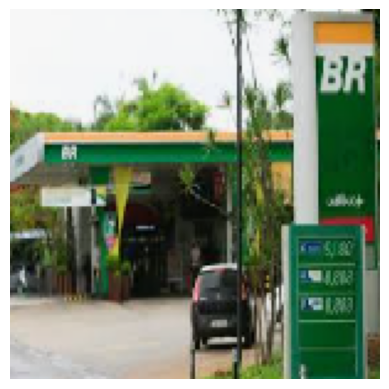

Label verdadeiro: y
Previsão: y
Probabilidade: 0.99960107
---------------------------------------


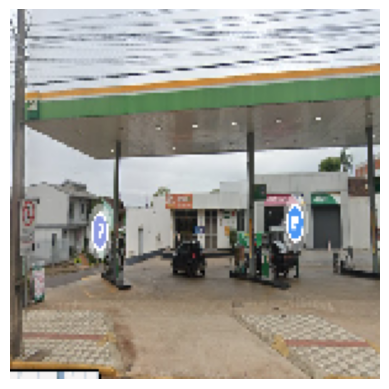

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9763072
---------------------------------------


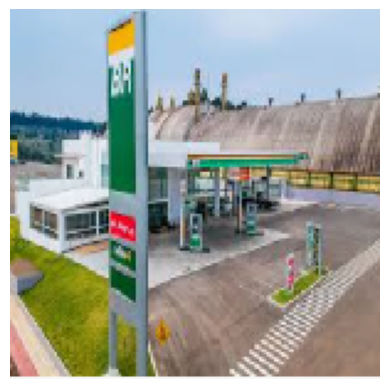

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9935719
---------------------------------------


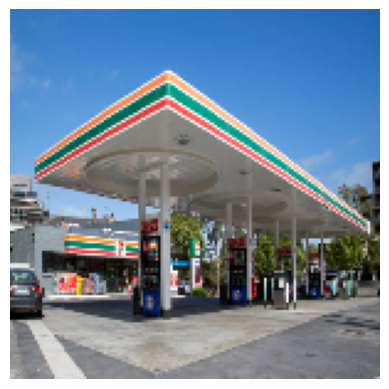

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9995144879503641
---------------------------------------


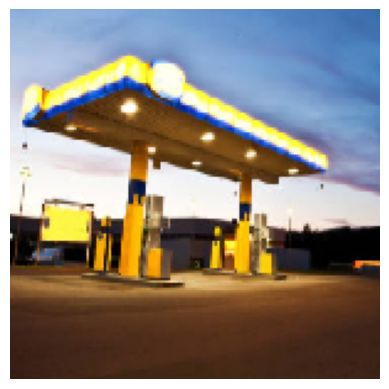

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999970849748934
---------------------------------------


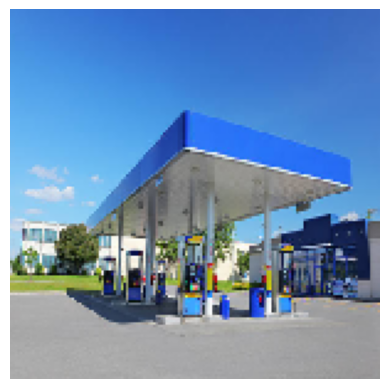

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999993299742869
---------------------------------------


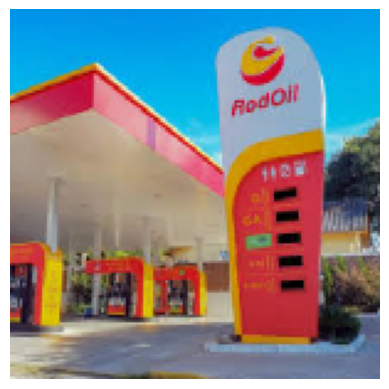

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


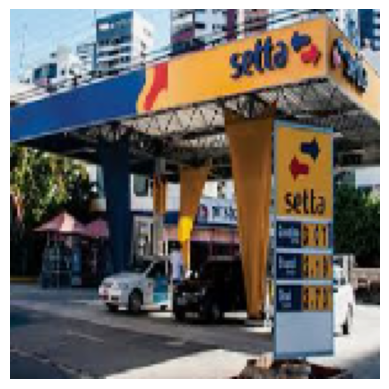

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999778771667
---------------------------------------


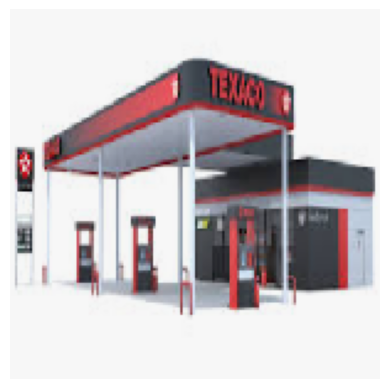

Label verdadeiro: n
Previsão: n
Probabilidade: 1.0
---------------------------------------


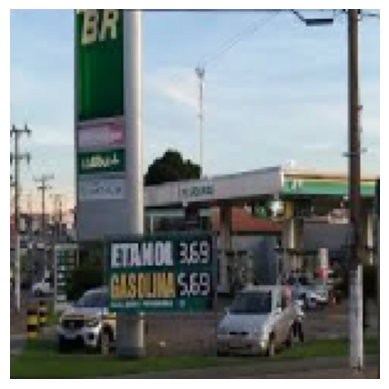

Label verdadeiro: y
Previsão: y
Probabilidade: 0.99974126
---------------------------------------


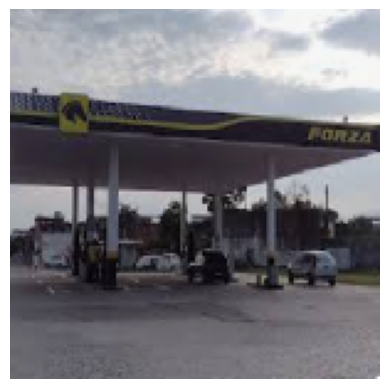

Label verdadeiro: n
Previsão: y
Probabilidade: 0.99814993
---------------------------------------


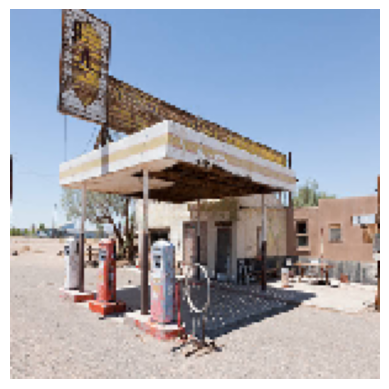

Label verdadeiro: n
Previsão: y
Probabilidade: 0.9888411
---------------------------------------


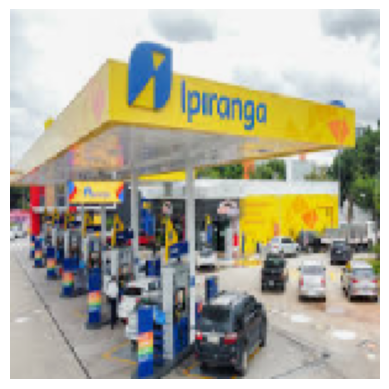

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9990947324549779
---------------------------------------


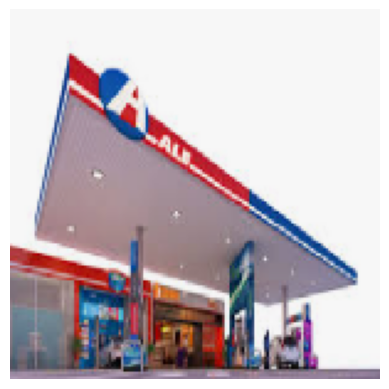

Label verdadeiro: n
Previsão: n
Probabilidade: 0.9999999999999969
---------------------------------------


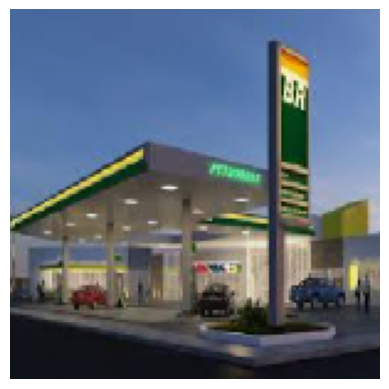

Label verdadeiro: y
Previsão: y
Probabilidade: 0.9565053
---------------------------------------


In [32]:
# Lista para armazenar as previsões
y_pred = []
# Lista para armazenar os rótulos verdadeiros
y_true = []
# Nomes das classes
class_names = ['n', 'y']
# Contador para controlar o número de imagens exibidas
count = 0

# Loop do data generator de teste que contém as imagens
for batch in test_generator:
    images = batch[0]  # Obtém as imagens
    labels = batch[1]  # Obtém os rótulos verdadeiros

    # Faz as previsões para o lote atual de imagens
    predictions = model.predict(images)

    # Loop para visualizar as imagens e as informações de previsão
    for i in range(len(images)):
        # Verifica se o número máximo de imagens foi excedido
        if count == 50:
            break

        # Obtém a imagem atual e seu rótulo verdadeiro
        image = images[i]
        true_label = class_names[int(labels[i])]

        # Obtém a previsão e a probabilidade para a imagem atual
        prediction = predictions[i][0]
        predicted_class = 1 if prediction >= 0.5 else 0
        predicted_label = class_names[predicted_class]
        probability = prediction if predicted_class == 1 else 1 - prediction

        # Exibe a imagem
        plt.imshow(image)
        plt.axis('off')
        plt.show()

        # Imprime as informações da classificação da imagem
        print("Label verdadeiro:", true_label)
        print("Previsão:", predicted_label)
        print("Probabilidade:", probability)
        print("---------------------------------------")

        # Adiciona as previsões e os rótulos verdadeiros às listas
        y_pred.append(predicted_class)
        y_true.append(int(labels[i]))

        # Incrementa o contador
        count += 1

    # Verifica se o número máximo de imagens foi excedido
    if count == 50:
        break

# Converte as listas em arrays numpy para facilitar a manipulação
y_pred = np.array(y_pred)
y_true = np.array(y_true)

Sob uma inspeção visual, pode se dizer que houve um resultado satisfatório na amostra escolhida, com apenas alguns erros. Em seguida, vamos avaliar a utilização do modelo.

## 11. Avaliação do modelo de deep learning



Nesta etapa vamos avaliar o modelo escolhido quanto a sua acurácia e demais métricas.

**Acurácia (Accuracy):** Esta métrica calcula a proporção de previsões corretas em relação ao total de previsões. É uma medida geral da precisão do modelo e é útil quando as classes estão balanceadas. No entanto, pode ser enganosa se as classes estiverem desbalanceadas, como é o nosso caso.

In [33]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_true, y_pred)

print("Acurácia:", accuracy)


Acurácia: 0.94


**Matriz de Confusão (Confusion Matrix):** Uma matriz de confusão é uma tabela que mostra o desempenho do modelo em termos de verdadeiros positivos (TP), falsos positivos (FP), verdadeiros negativos (TN) e falsos negativos (FN). É útil para entender melhor como o modelo está classificando as amostras de cada classe e pode ser usado para calcular outras métricas, como precisão e recall.

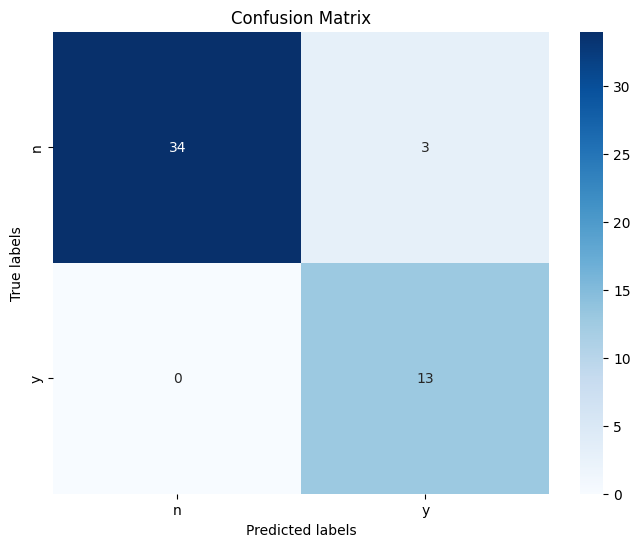

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calcula a matriz de confusão
conf_matrix = confusion_matrix(y_true, y_pred)

# Plota a matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

**Precision (Precisão):** A precisão mede a proporção de instâncias classificadas como positivas (ou de interesse) corretamente em relação ao total de instâncias classificadas como positivas pelo modelo. Em outras palavras, é a habilidade do modelo de não classificar erroneamente as instâncias negativas como positivas.

In [35]:
from sklearn.metrics import precision_score

# Calcula a precisão
precision = precision_score(y_true, y_pred)

# Imprime o resultado
print("Precisão: {:.2f}".format(precision))

Precisão: 0.81


**Recall (Revocação ou Sensibilidade):** O recall mede a proporção de instâncias positivas corretamente classificadas pelo modelo em relação ao total de instâncias positivas presentes nos dados. Em outras palavras, é a habilidade do modelo de encontrar todas as instâncias positivas.

In [36]:
from sklearn.metrics import recall_score

# Calcula o recall
recall = recall_score(y_true, y_pred)

# Imprime o resultado
print("Recall: {:.2f}".format(recall))

Recall: 1.00


**F1 Score:** O F1 score é a média harmônica da precisão e do recall. Ele fornece uma única métrica que combina tanto a precisão quanto o recall, o que é útil quando se deseja ter um equilíbrio entre essas duas métricas. É importante observar que o F1 score é mais adequado quando há um desequilíbrio entre as classes, pois leva em consideração tanto falsos positivos quanto falsos negativos.

In [37]:
from sklearn.metrics import f1_score

# Calcula o F1 score
f1 = f1_score(y_true, y_pred)

# Imprime o resultado
print("F1 Score: {:.2f}".format(f1))

F1 Score: 0.90


**Resumo das métricas de avaliação do modelo e apontamentos**

In [38]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred)
recall = skm.recall_score(y_true, y_pred)
f1score = skm.f1_score(y_true, y_pred)

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.94
Precision:  0.8125
Recall:  1.0
F1 Score:  0.896551724137931


**Conclusões sobre as métricas:** Com uma acurácia de 90%, o modelo tem uma boa taxa geral de classificação correta. A precisão de 92.3% indica que a maioria das amostras classificadas como positivas são realmente positivas, o que é positivo. No entanto, o recall de 75% sugere que o modelo pode estar perdendo algumas das amostras positivas, o que pode ser preocupante, dependendo do contexto do problema. O F1 score de 82.8% é uma métrica combinada da precisão e do recall, oferecendo uma visão mais completa do desempenho do modelo, e parece equilibrado neste caso, mas ainda há espaço para melhorias no recall. Em resumo, o modelo está indo bem em termos de classificação correta das amostras positivas e negativas, mas pode haver margem para otimização, especialmente em relação à captura de todas as amostras positivas. Isso mostra que com um número maior de amostras, há uma probabilidade que o modelo funcione muito bem.








## 12. Exportação do modelo de deep learning

Input de comando para salvar o modelo de deep learning que foi treinado

In [39]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/dogs_vs_cats/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2024-04-27T1920.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## 13. Conclusões finais

A arquitetura convolucional utilizada é típica para problemas de classificação de imagens, mas requer um conjunto de dados de treinamento adequado para evitar overfitting devido ao grande número de parâmetros treináveis. Com apenas 315 imagens no conjunto de dados, há preocupações com overfitting, alta sensibilidade aos dados de treinamento, dificuldade em generalizar e limitações na complexidade do modelo. Técnicas de regularização, como Dropout e aumento de dados, são essenciais para ajudar a mitigar esses problemas.

O treinamento do modelo foi interrompido prematuramente devido à falta de dados suficientes para preencher todas as etapas de uma época, indicando que o modelo pode estar aprendendo muito rapidamente e não está recebendo dados suficientes para generalizar adequadamente. A solução proposta inclui ajustes nos hiperparâmetros, como a modificação da taxa de aprendizado, para tentar influenciar na convergência do modelo durante o treinamento.

As métricas obtidas mostram que o modelo tem uma boa acurácia geral, mas há espaço para melhorias no recall, indicando que o modelo pode estar perdendo algumas das amostras positivas. O F1 score, uma métrica combinada de precisão e recall, está equilibrado, mas ainda há margem para otimização.

Apesar das limitações devido ao tamanho do conjunto de dados, o modelo demonstra potencial com uma adequada otimização e um conjunto de dados maior. Propõe-se a coleta de mais amostras de dados e ajustes adicionais nos hiperparâmetros para melhorar ainda mais o desempenho do modelo. Com essas melhorias, o modelo pode ser útil em aplicações práticas de classificação de imagens.